In [4]:
import pandas as pd
import matplotlib.pyplot as plt 
import numpy as np
import seaborn as sns
from IPython.display import display, HTML
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from matplotlib.lines import Line2D
import altair as alt


<h2>Read file and show some basic information</h2>

In [5]:
file_to_test = r"C:.\preprocessed_data.csv"
data = pd.read_csv(file_to_test)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 4000)
display(data.head())



,State,Sex,GeneralHealth,PhysicalHealthDays,MentalHealthDays,PhysicalActivities,SleepHours,HadHeartAttack,HadAngina,HadStroke,HadAsthma,HadSkinCancer,HadCOPD,HadDepressiveDisorder,HadKidneyDisease,HadArthritis,HadDiabetes,DeafOrHardOfHearing,BlindOrVisionDifficulty,DifficultyConcentrating,DifficultyWalking,DifficultyDressingBathing,DifficultyErrands,SmokerStatus,ChestScan,RaceEthnicityCategory,AgeCategory,BMI,AlcoholDrinkers,HighRiskLastYear,CovidPos
0,Alabama,female,excellent,none,none,no,low,no,no,no,no,yes,no,no,no,no,no,no,no,no,no,no,no,non-smoker,no,white,80+,26.6,no,no,no
1,Alabama,female,very good,low,low,yes,very low,no,no,no,no,yes,no,no,no,no,no,no,no,no,no,no,no,non-smoker,no,white,55-59,25.8,no,no,yes
2,Alabama,female,fair,low,none,yes,high,no,no,no,no,no,no,no,no,no,no,no,no,no,no,no,no,non-smoker,yes,white,40-44,21.9,yes,no,no
3,Alabama,male,poor,low,none,no,normal,yes,no,yes,no,no,no,no,no,no,yes,no,no,no,no,no,no,non-smoker,no,white,80+,26.2,no,no,no
4,Alabama,female,very good,none,none,yes,normal,no,no,no,no,no,no,no,no,no,no,no,no,no,no,no,no,former smoker,no,black,80+,23.0,yes,no,no


In [6]:
data.describe(include=[object])

,State,Sex,GeneralHealth,PhysicalHealthDays,MentalHealthDays,PhysicalActivities,SleepHours,HadHeartAttack,HadAngina,HadStroke,HadAsthma,HadSkinCancer,HadCOPD,HadDepressiveDisorder,HadKidneyDisease,HadArthritis,HadDiabetes,DeafOrHardOfHearing,BlindOrVisionDifficulty,DifficultyConcentrating,DifficultyWalking,DifficultyDressingBathing,DifficultyErrands,SmokerStatus,ChestScan,RaceEthnicityCategory,AgeCategory,AlcoholDrinkers,HighRiskLastYear,CovidPos
count,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266,312266
unique,54,2,5,4,4,2,5,2,2,2,2,2,2,2,2,2,4,2,2,2,2,2,2,3,2,5,13,2,2,2
top,Washington,female,very good,none,none,yes,normal,no,no,no,no,no,no,no,no,no,no,no,no,no,no,no,no,non-smoker,no,white,65-69,yes,no,no
freq,18760,161562,109926,193172,187846,242546,186060,295246,293226,299300,265530,286318,287966,246785,298356,207165,261187,285592,296726,277476,266621,301370,290636,188601,180909,236445,34170,171208,298040,211406


In [7]:
dict_categories = {
    'Lifestyle':['PhysicalHealthDays','MentalHealthDays','PhysicalActivities','SleepHours','SmokerStatus','AlcoholDrinkers','ECigaretteUsage',],
    'Medical':['GeneralHealth','HadHeartAttack','HadAngina','HadStroke','HadAsthma','HadSkinCancer','HadCOPD','HadDepressiveDisorder','HadKidneyDisease','HadArthritis','HadDiabetes','DeafOrHardOfHearing','BlindOrVisionDifficulty','DifficultyConcentrating','DifficultyWalking','DifficultyDressingBathing','DifficultyErrands','HighRiskLastYear','CovidPos','ChestScan','LastCheckupTime','RemovedTeeth','HIVTesting','FluVaxLast12','PneumoVaxEver','TetanusLast10Tdap'],
    'Characteristics':[ 'State', 'Sex', 'RaceEthnicityCategory', 'AgeCategory', 'BMI','HeightInMeters','WeightInKilograms']
}

categories = []
for col in data.columns:
    categories.append([i for i in dict_categories if col in dict_categories[i]])



In [8]:
data_for_statecodes = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_us_ag_exports.csv')[['code','state']].reset_index()

def set_statecode(row):
    if(data_for_statecodes[data_for_statecodes['state'] == row['State']].empty != True):
        return data_for_statecodes[data_for_statecodes['state'] == row['State']]['code'].values[0]
    else:
        return ''


In [9]:
data_country_asthma  = data[data['HadAsthma']=='yes'].groupby(['State']).count()['HadAsthma']
data_country_asthma = pd.DataFrame(data_country_asthma).reset_index()
data_country_asthma['Code'] = data_country_asthma.apply(set_statecode, axis=1)
data_country_asthma = data_country_asthma[data_country_asthma['Code'] != '']
data_country_asthma

,State,HadAsthma,Code
0,Alabama,484,AL
1,Alaska,620,AK
2,Arizona,1084,AZ
3,Arkansas,529,AR
4,California,1114,CA
5,Colorado,1060,CO
6,Connecticut,1072,CT
7,Delaware,417,DE
9,Florida,1238,FL
10,Georgia,900,GA


In [10]:
fig = go.Figure(data=go.Choropleth(
    locations=data_country_asthma['Code'], 
    z = data_country_asthma['HadAsthma'].astype(float),
    locationmode = 'USA-states',
    colorscale = 'Blues',
))

fig.update_layout(
    title_text = 'Asthma prevalence in US',
    title_x=0.5,
    geo_scope='usa', 
)

fig.show()

In [11]:
data_state_count = data['State'].value_counts().reset_index()
data_state_count['Code'] = data_country_asthma.apply(set_statecode, axis=1)

print(data_state_count)
fig = px.scatter_geo(data_state_count, locations="Code",
                     size="count",
                      locationmode = 'USA-states',
                     )
fig.update_layout(
    title_text = 'Distribution of people surveyed',
    title_x=0.5,
    geo_scope='usa', 
)

fig.show()

                   State  count Code
0             Washington  18760   AL
1              Minnesota  11739   AK
2               New York  11466   AZ
3                   Ohio  11198   AR
4               Maryland  11155   CA
5                  Texas   9311   CO
6                Florida   9023   CT
7                 Kansas   8067   DE
8                  Maine   7813  NaN
9              Wisconsin   7738   FL
10         Massachusetts   7544   GA
11                  Utah   7152  NaN
12              Virginia   7144   HI
13               Arizona   6864   ID
14            California   6846   IL
15               Indiana   6844   IN
16              Michigan   6830   IA
17                  Iowa   6812   KS
18        South Carolina   6745   KY
19              Colorado   6717   LA
20           Connecticut   6405   ME
21                Hawaii   6388   MD
22               Vermont   6232   MA
23               Georgia   6146   MI
24              Nebraska   5969   MN
25          South Dakota   5666   MS
2

In [12]:
########## NICE DATA TABLE ###########
df_description = pd.DataFrame()
df_description['Column'] = data.columns
df_description['Type'] = [data[col].dtype for col in data.columns ]
df_description['Unique'] = [data[col].unique().tolist() for col in data.columns]
df_description['Category'] = [ x for xs in categories for x in xs ]

display(df_description)
print()


,Column,Type,Unique,Category
0,State,object,"[Alabama, Alaska, Arizona, Arkansas, Californi...",Characteristics
1,Sex,object,"[female, male]",Characteristics
2,GeneralHealth,object,"[excellent, very good, fair, poor, good]",Medical
3,PhysicalHealthDays,object,"[none, low, high, moderate]",Lifestyle
4,MentalHealthDays,object,"[none, low, moderate, high]",Lifestyle
5,PhysicalActivities,object,"[no, yes]",Lifestyle
6,SleepHours,object,"[low, very low, high, normal, very high]",Lifestyle
7,HadHeartAttack,object,"[no, yes]",Medical
8,HadAngina,object,"[no, yes]",Medical
9,HadStroke,object,"[no, yes]",Medical


Text(0.5, 0.95, 'Race Ethnicity in the top 4 states with the most respondents')

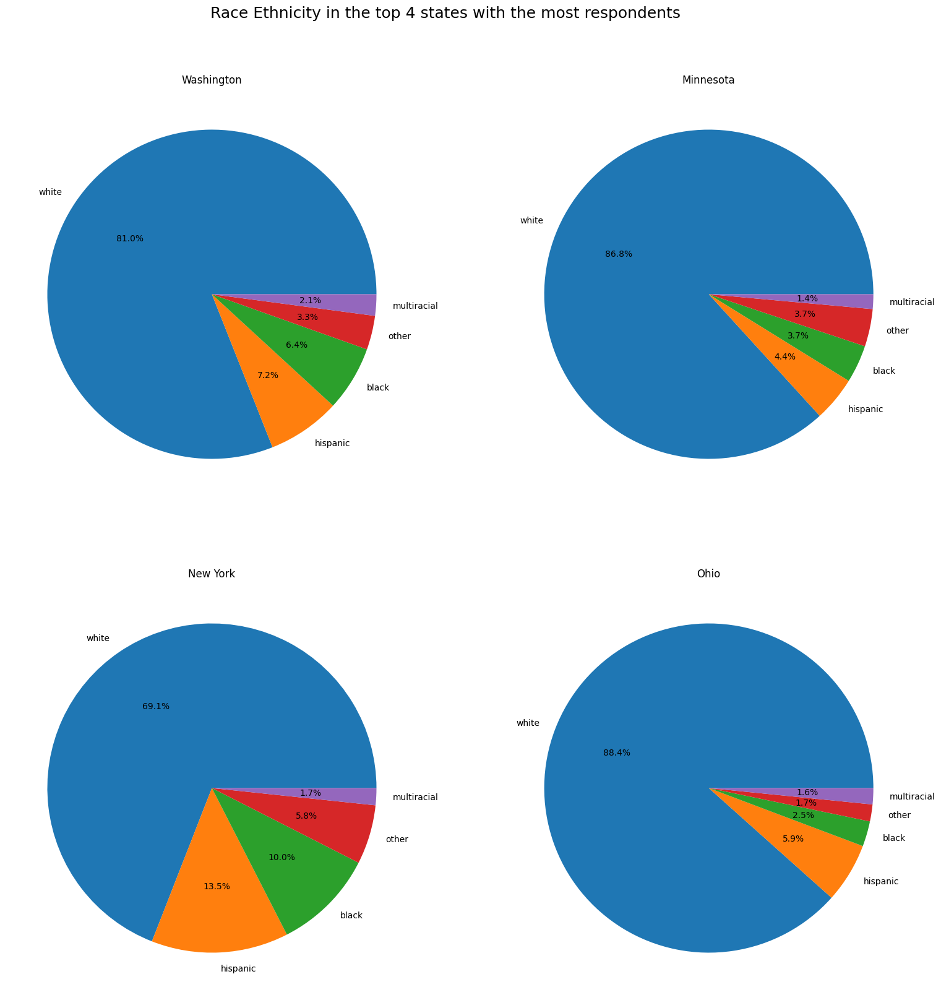

In [13]:
fig, axs = plt.subplots(2,2, figsize=(19,19))

states = data['State'].value_counts()
axs[0][0].pie(data[data['State'] == states.index[0]]['RaceEthnicityCategory'].value_counts(), labels=data['RaceEthnicityCategory'].value_counts().index, autopct='%1.1f%%')
axs[0][0].set_title(f"{states.index[0]}")

axs[0][1].pie(data[data['State'] == states.index[1]]['RaceEthnicityCategory'].value_counts(), labels=data['RaceEthnicityCategory'].value_counts().index, autopct='%1.1f%%')
axs[0][1].set_title(f"{states.index[1]}")

axs[1][0].pie(data[data['State'] == states.index[2]]['RaceEthnicityCategory'].value_counts(), labels=data['RaceEthnicityCategory'].value_counts().index, autopct='%1.1f%%')
axs[1][0].set_title(f"{states.index[2]}")

axs[1][1].pie(data[data['State'] == states.index[3]]['RaceEthnicityCategory'].value_counts(), labels=data['RaceEthnicityCategory'].value_counts().index, autopct='%1.1f%%')
axs[1][1].set_title(f"{states.index[3]}")
fig.suptitle('Race Ethnicity in the top 4 states with the most respondents', fontsize=18, y=0.95)

<Axes: xlabel='count', ylabel='AgeCategory'>

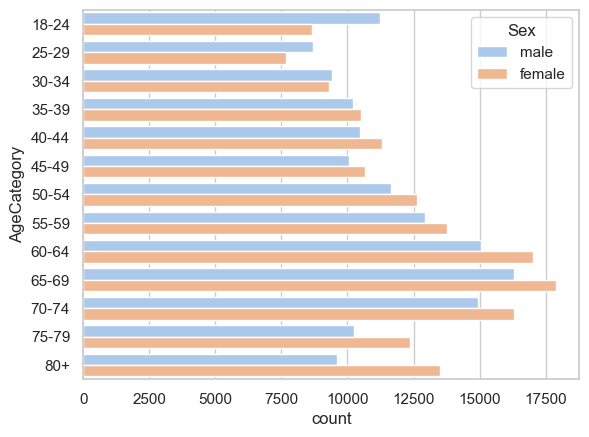

In [41]:
sns.countplot(data.sort_values(by=['AgeCategory']), y="AgeCategory", hue='Sex')


In [15]:
data = data.sort_values(by=['AgeCategory'])

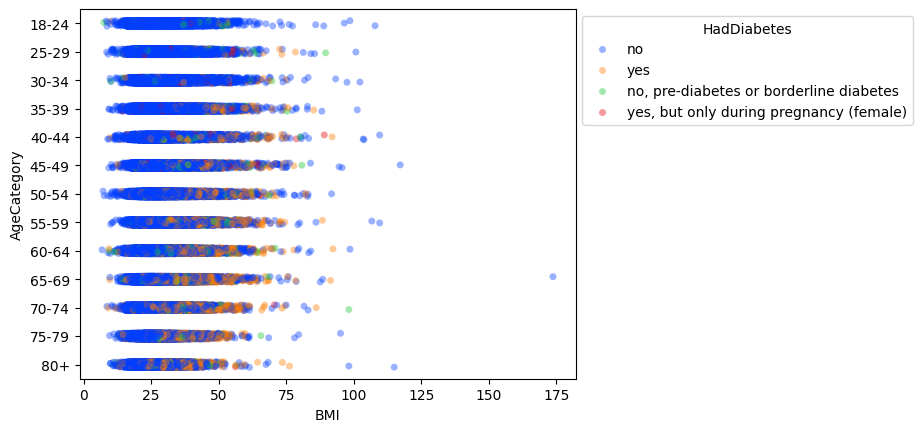

In [16]:
ax = sns.stripplot(
    data=data,
    x='BMI',
    y='AgeCategory',
    hue='HadDiabetes',
    palette='bright',
    hue_order=[
        'no',
        'yes',
        'no, pre-diabetes or borderline diabetes',
        'yes, but only during pregnancy (female)'
    ],
    alpha=0.4,
    )
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))


<Figure size 1500x800 with 0 Axes>

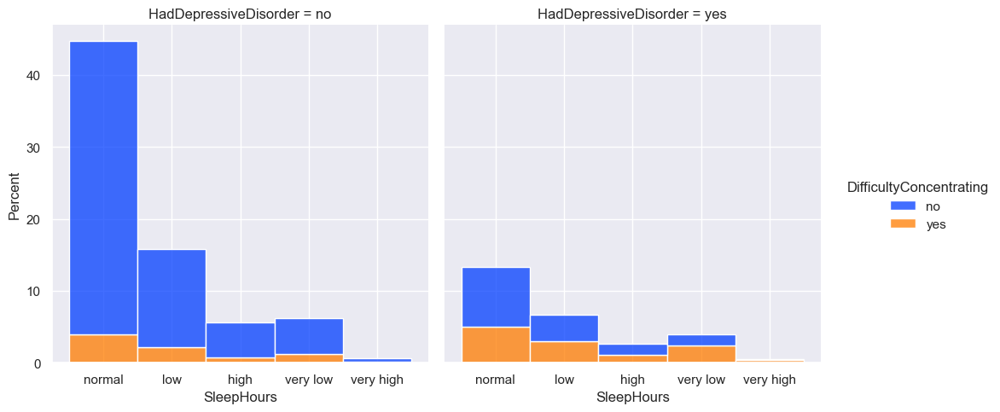

<Figure size 1500x800 with 0 Axes>

In [17]:
sns.set()
sns.set_palette("bright")

sns.displot(
    data=data[data['AgeCategory'] < '24'],
    x='SleepHours',
    hue='DifficultyConcentrating',
    stat = 'percent',
    kind='hist',
    col='HadDepressiveDisorder',
    multiple='stack'
)

plt.figure(figsize=(15,8))



<Figure size 1500x800 with 0 Axes>

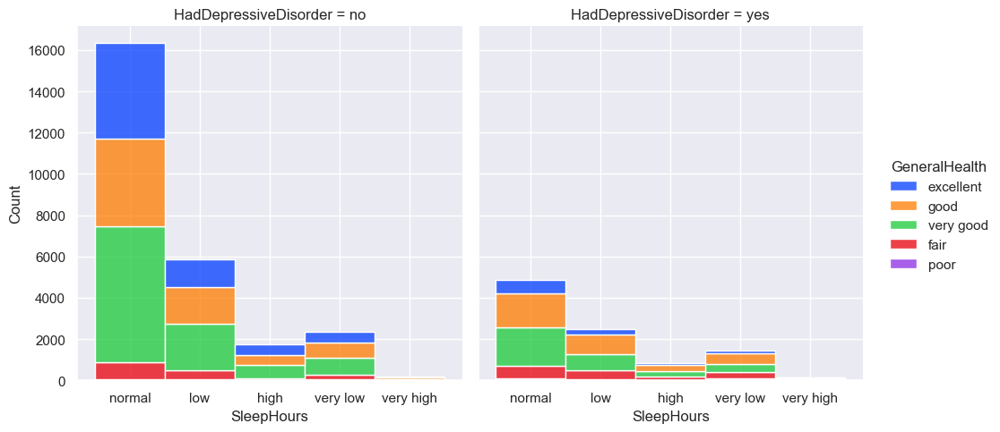

<Figure size 1500x800 with 0 Axes>

In [18]:
sns.set()
sns.set_palette("bright")

sns.displot(
    data=data[data['AgeCategory'] < '30'],
    x='SleepHours',
    hue='GeneralHealth',
    kind='hist',
    col='HadDepressiveDisorder',
    multiple='stack',
)

plt.figure(figsize=(15,8))



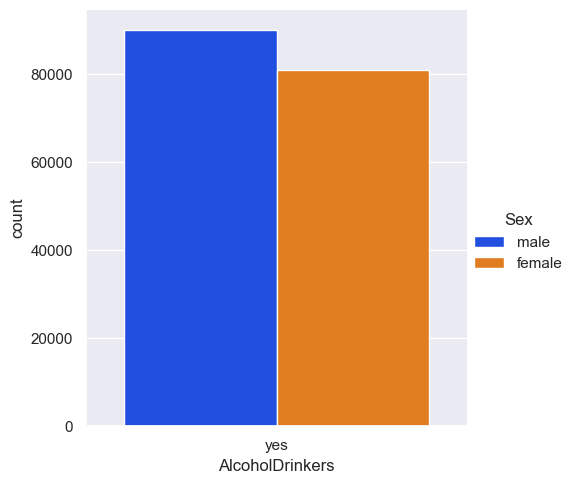

In [19]:
filter=data['AlcoholDrinkers'] == 'yes'
sns.catplot(data=data[filter], x="AlcoholDrinkers", hue='Sex' , kind='count')


<Axes: xlabel='Count', ylabel='AgeCategory'>

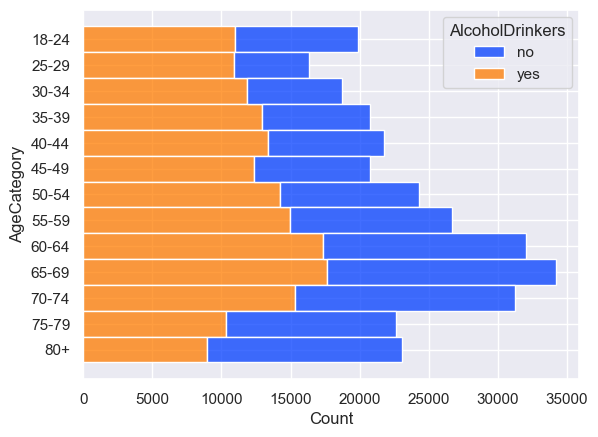

In [20]:
sns.histplot(data=data.sort_values(by=['AgeCategory']), y="AgeCategory", hue="AlcoholDrinkers", multiple="stack")

C:\Users\emmai\AppData\Local\Temp\ipykernel_18284\3937528418.py:5: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:red'` for the same effect.


C:\Users\emmai\AppData\Local\Temp\ipykernel_18284\3937528418.py:7: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:green'` for the same effect.


C:\Users\emmai\AppData\Local\Temp\ipykernel_18284\3937528418.py:9: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:blue'` for the same effect.




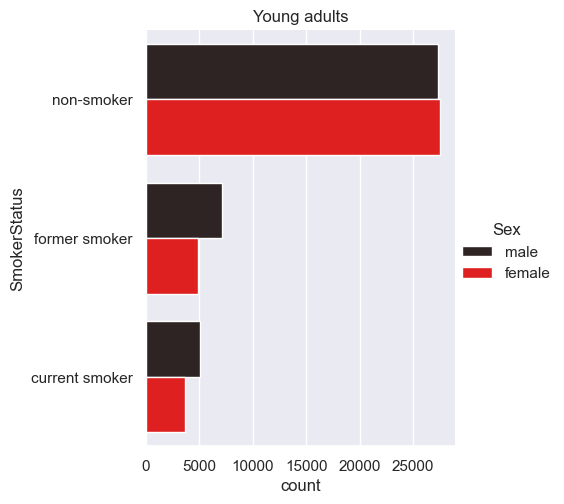

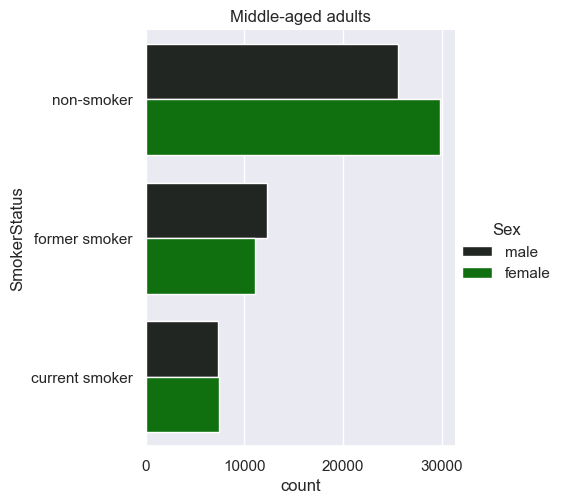

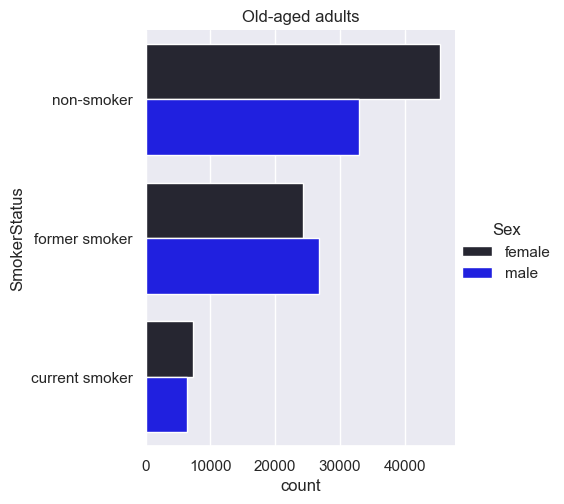

In [21]:
list1_ya =  ['Disorder','18-24', '25-29', '30-34', '35-39']
list2_ma = ['Disorder','40-44', '45-49', '50-54', '55-59']
list3_oa = ['Disorder','60-64', '65-69', '70-74', '75-79', '80+']

g1 = sns.catplot(data=data[data['AgeCategory']<'40'].sort_values(by=['AgeCategory']), y="SmokerStatus", kind='count', hue='Sex', color='red' )
g1.set(title='Young adults')
g2 = sns.catplot(data=data[(data['AgeCategory']>'40') & (data['AgeCategory']<'60') ].sort_values(by=['AgeCategory']), y="SmokerStatus", kind='count', hue='Sex', color='green')
g2.set(title='Middle-aged adults')
g3 = sns.catplot(data=data[data['AgeCategory']>'60'].sort_values(by=['AgeCategory']), y="SmokerStatus", kind='count', hue='Sex', color='blue')
g3.set(title='Old-aged adults')


([0, 1, 2, 3],
 [Text(0, 0, 'no'),
  Text(1, 0, 'no, pre-diabetes or borderline diabetes'),
  Text(2, 0, 'yes'),
  Text(3, 0, 'yes, but only during pregnancy (female)')])

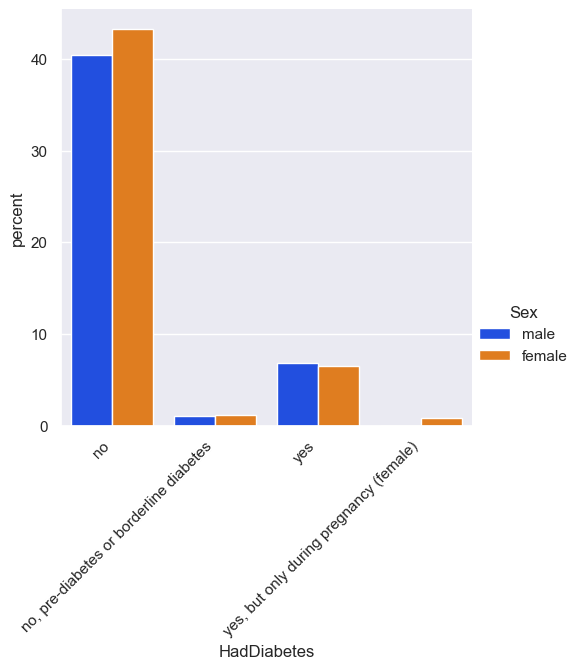

In [22]:
sns.catplot(data=data, x="HadDiabetes", kind='count', hue='Sex', stat='percent')
plt.xticks(rotation=45, ha='right')


<Axes: xlabel='BMI', ylabel='HadDiabetes'>

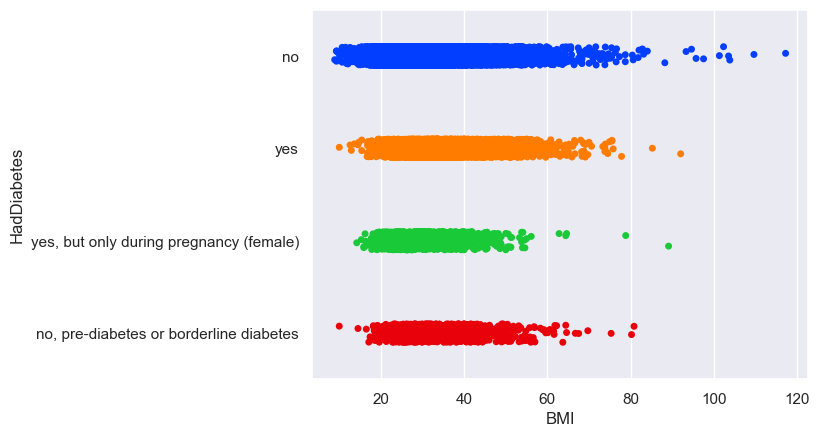

In [23]:
sns.stripplot(
    data=data[(data['AgeCategory'] > '30') & (data['AgeCategory'] < '50' )],
    x='BMI',
    y='HadDiabetes',
    hue='HadDiabetes',
    legend=False,
)


In [24]:
ser1 = data[data['HadHeartAttack']=='yes'].groupby(['AgeCategory']).count()['HadHeartAttack']
ser2 = data[data['HadAngina']=='yes'].groupby(['AgeCategory']).count()['HadAngina']
ser3 = data[data['HadStroke']=='yes'].groupby(['AgeCategory']).count()['HadStroke']
ser4 = data[data['HadAsthma']=='yes'].groupby(['AgeCategory']).count()['HadAsthma']
ser5 = data[data['HadSkinCancer']=='yes'].groupby(['AgeCategory']).count()['HadSkinCancer']
ser6 = data[data['HadCOPD']=='yes'].groupby(['AgeCategory']).count()['HadCOPD']
ser7 = data[data['HadDepressiveDisorder']=='yes'].groupby(['AgeCategory']).count()['HadDepressiveDisorder']

filt_data = {
    'HadHeartAttack':ser1,
    'HadAngina':ser2,
    'HadStroke':ser3,
    'HadAsthma':ser4,
    'HadSkinCancer':ser5,
    'HadCOPD':ser6,
    'HadDepressiveDisorder':ser7,
}
filtered_data = pd.DataFrame(index=ser1.index, data=filt_data)


In [25]:
list_observed_diseases = ['HadHeartAttack','HadAngina','HadStroke','HadAsthma','HadSkinCancer','HadCOPD','HadDepressiveDisorder','HadKidneyDisease','HadArthritis','HadDiabetes','DeafOrHardOfHearing','BlindOrVisionDifficulty','DifficultyConcentrating','DifficultyWalking',]
group_data = filtered_data.transpose().reset_index()
group_data = group_data.rename(columns={'index':'Disorder'})
list1 =  ['Disorder','18-24', '25-29', '30-34', '35-39']
list2 = ['Disorder','40-44', '45-49', '50-54', '55-59']
list3 = ['Disorder','60-64', '65-69', '70-74', '75-79', '80+']
filters_list = [list1, list2, list3]


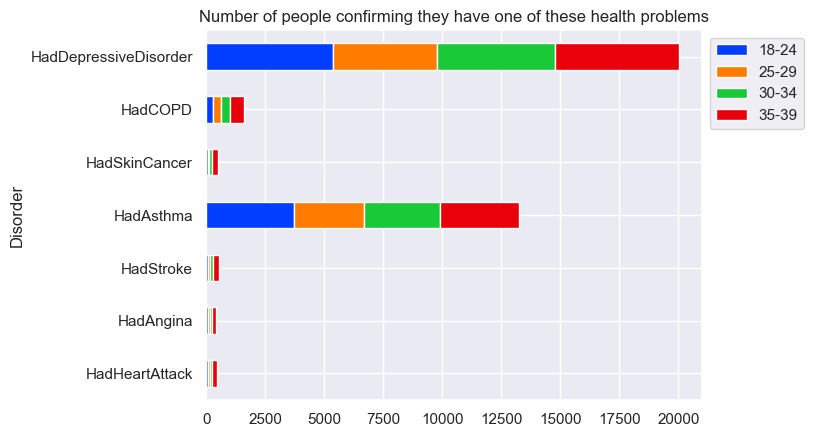

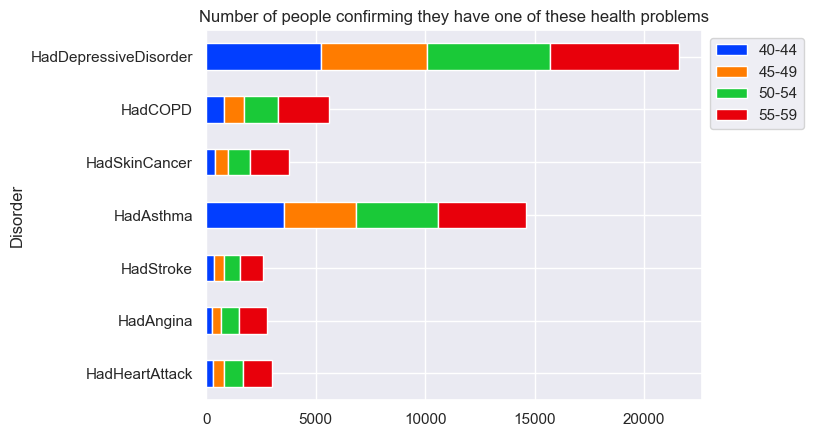

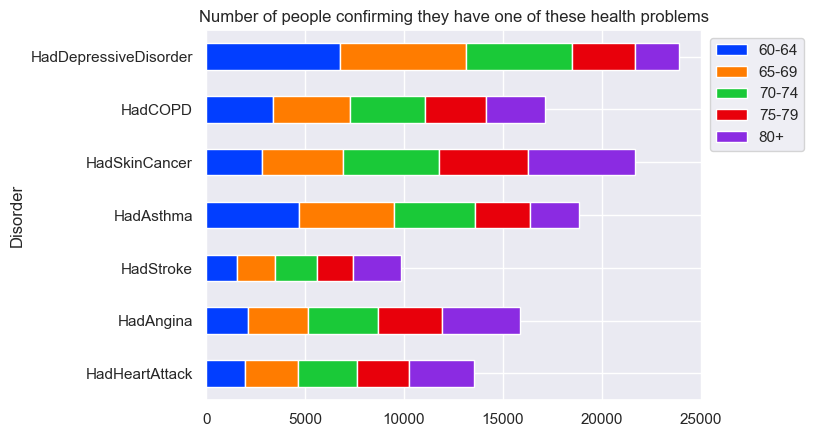

In [26]:
for el in filters_list:
  group_data[el].plot( 
    x = 'Disorder',  
    kind = 'barh',  
    stacked = True,  
    title = 'Number of people confirming they have one of these health problems',  
    mark_right = True) 
  plt.legend(bbox_to_anchor=(1.0, 1.0))
  plt.show()

In [27]:
sns.set_theme()

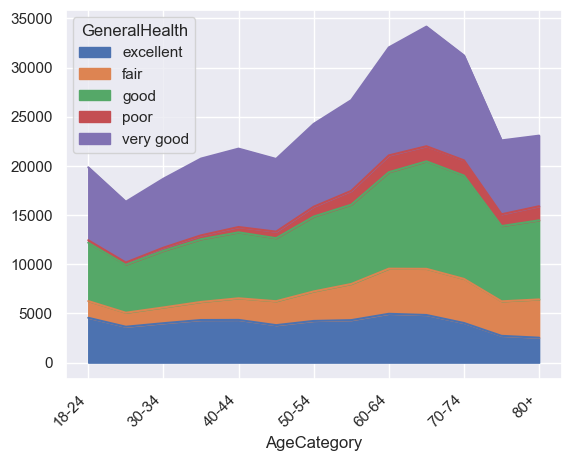

In [28]:
data.groupby(['AgeCategory', 'GeneralHealth']).size().unstack().plot(kind='area', stacked=True)
plt.xticks(rotation=45, ha='right')
plt.show()

In [29]:
row_bin = ['no','yes']
list_cols_bin = []
list_cols_bin_yes = []
list_cols_bin_no = []

# get binary columns
def get_binary(row):
    row_unique = row['Unique']
    if(any(x in row_bin for x in row_unique) and len(row_unique)):
        list_cols_bin.append(row['Column'])

df_description.apply(get_binary, axis=1)

for i in list_cols_bin:
    print(i)
    print(data[data[i]=='yes'][i].count())
    print(data[data[i]=='no'][i].count())
    list_cols_bin_yes.append(data[data[i]=='yes'][i].count())
    list_cols_bin_no.append(data[data[i]=='no'][i].count())


# create df with binary columns and count
df_count_bin_vars = pd.DataFrame({'Col':list_cols_bin, 'Yes_count':list_cols_bin_yes, 'No_count':list_cols_bin_no})

list_cols_total = df_count_bin_vars['Col'].values.tolist()

# keep only columns showing health disorders
list_cols_to_remove = ['AlcoholDrinkers','PhysicalActivities','ChestScan']
 
list_cols_to_plot = [ elem for elem in list_cols_total if elem not in list_cols_to_remove]

df_count_bin_vars_disorders =  df_count_bin_vars[df_count_bin_vars['Col'].isin(list_cols_to_plot)]


PhysicalActivities
242546
69720
HadHeartAttack
17020
295246
HadAngina
19040
293226
HadStroke
12966
299300
HadAsthma
46736
265530
HadSkinCancer
25948
286318
HadCOPD
24300
287966
HadDepressiveDisorder
65481
246785
HadKidneyDisease
13910
298356
HadArthritis
105101
207165
HadDiabetes
41544
261187
DeafOrHardOfHearing
26674
285592
BlindOrVisionDifficulty
15540
296726
DifficultyConcentrating
34790
277476
DifficultyWalking
45645
266621
DifficultyDressingBathing
10896
301370
DifficultyErrands
21630
290636
ChestScan
131357
180909
AlcoholDrinkers
171208
141058
HighRiskLastYear
14226
298040
CovidPos
100860
211406


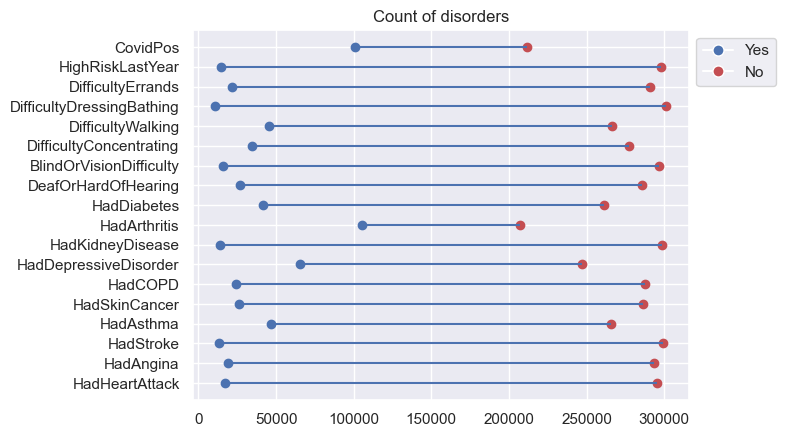

In [30]:
range_plot = list(range(0,df_count_bin_vars_disorders.shape[0]))


legend_elements = [Line2D([0], [0], marker='o', color='w', label='Yes', markerfacecolor='b', markersize=8),
                   Line2D([0], [0], marker='o', color='w', label='No', markerfacecolor='r', markersize=8)]

plt.hlines(y=range_plot, xmin=df_count_bin_vars_disorders['Yes_count'], xmax=df_count_bin_vars_disorders['No_count'])
plt.scatter(x=df_count_bin_vars_disorders['Yes_count'], y=range_plot, color='b', marker='o')
plt.scatter(x=df_count_bin_vars_disorders['No_count'], y=range_plot, color='r', marker='o')
plt.yticks(range_plot,df_count_bin_vars_disorders['Col'] )
plt.legend(handles=legend_elements, bbox_to_anchor=(1.0, 1.0))
plt.title('Count of disorders')

plt.show()

C:\Users\emmai\AppData\Local\Temp\ipykernel_18284\4027137154.py:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



<Axes: >

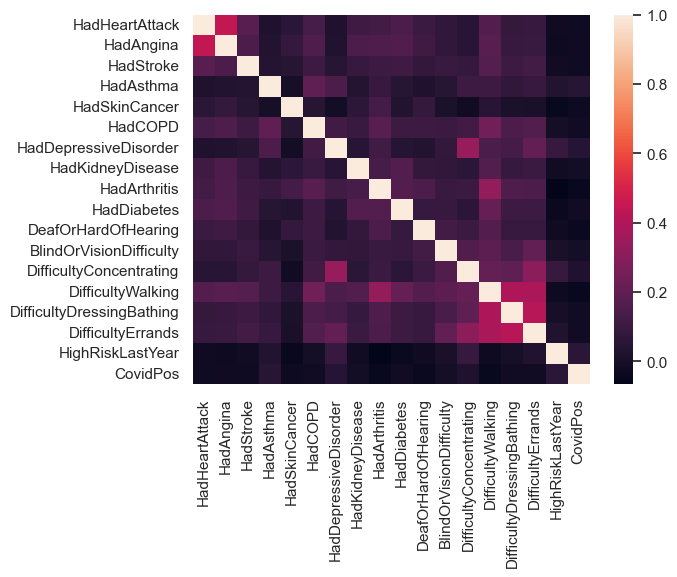

In [31]:
df_new = data[list_cols_to_plot].replace({'yes': 1, 'no': 0, 'no, pre-diabetes or borderline diabetes':0, 'yes, but only during pregnancy (female)':0})
sns.heatmap(df_new.corr())

In [32]:
binary_mapping = {
    'Sex': {'female': 0, 'male': 1},
    'PhysicalActivities': {'no': 0, 'yes': 1},
    'HadHeartAttack': {'no': 0, 'yes': 1},
    'HadAngina': {'no': 0, 'yes': 1},
    'HadStroke': {'no': 0, 'yes': 1},
    'HadAsthma': {'no': 0, 'yes': 1},
    'HadSkinCancer': {'no': 0, 'yes': 1},
    'HadCOPD': {'no': 0, 'yes': 1},
    'HadDepressiveDisorder': {'no': 0, 'yes': 1},
    'HadKidneyDisease': {'no': 0, 'yes': 1},
    'HadArthritis': {'no': 0, 'yes': 1},
    'DeafOrHardOfHearing': {'no': 0, 'yes': 1},
    'BlindOrVisionDifficulty': {'no': 0, 'yes': 1},
    'DifficultyConcentrating': {'no': 0, 'yes': 1},
    'DifficultyWalking': {'no': 0, 'yes': 1},
    'DifficultyDressingBathing': {'no': 0, 'yes': 1},
    'DifficultyErrands': {'no': 0, 'yes': 1},
    'AlcoholDrinkers': {'no': 0, 'yes': 1},
    'HighRiskLastYear': {'no': 0, 'yes': 1},
    'CovidPos': {'no': 0, 'yes': 1},
    'ChestScan': {'no': 0, 'yes': 1},
}

binary_mapping['HadDiabetes'] = {
    'no': 0,
    'yes': 1,
    'no, pre-diabetes or borderline diabetes': 2,
    'yes, but only during pregnancy (female)': 3
}

ordinal_mapping = {
    'GeneralHealth': {
        'poor': 0,
        'fair': 1,
        'good': 2,
        'very good': 3,
        'excellent': 4
    },
    'PhysicalHealthDays': {
        'none': 0,
        'low': 1,
        'moderate': 2,
        'high': 3
    },
    'MentalHealthDays': {
        'none': 0,
        'low': 1,
        'moderate': 2,
        'high': 3
    },
    'SleepHours': {
        'very low': 0,
        'low': 1,
        'normal': 2,
        'high': 3,
        'very high': 4
    },
    'SmokerStatus': {
        'non-smoker': 0,
        'former smoker': 1,
        'current smoker': 2
    },
    'RaceEthnicityCategory': {
        'white': 0,
        'black': 1,
        'hispanic': 2,
        'other': 3,
        'multiracial': 4
    },
    'AgeCategory': {
        '18-24': 0,
        '25-29': 1,
        '30-34': 2,
        '35-39': 3,
        '40-44': 4,
        '45-49': 5,
        '50-54': 6,
        '55-59': 7,
        '60-64': 8,
        '65-69': 9,
        '70-74': 10,
        '75-79': 11,
        '80+': 12
    }
}

data2 = data.replace(binary_mapping)
data2 = data.replace(ordinal_mapping)

C:\Users\emmai\AppData\Local\Temp\ipykernel_18284\2557074681.py:88: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`

C:\Users\emmai\AppData\Local\Temp\ipykernel_18284\2557074681.py:89: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



<Figure size 800x600 with 0 Axes>

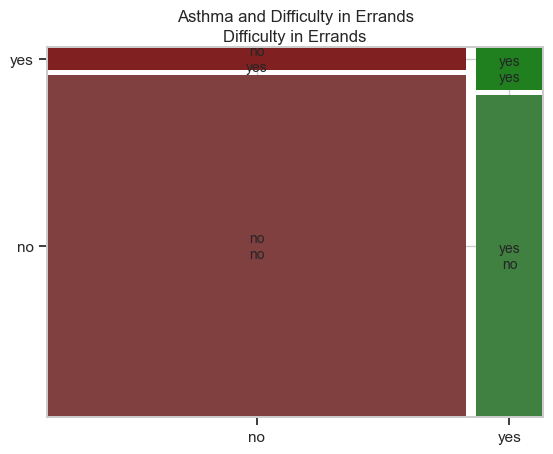

In [37]:
from statsmodels.graphics.mosaicplot import mosaic

sns.set_theme(style='whitegrid', palette='pastel')

plt.figure(figsize=(8, 6))
mosaic(sampled_data, ['HadAsthma', 'DifficultyErrands'], gap=0.02, title='Asthma and Difficulty in Errands')

plt.xlabel('Difficulty in Errands')
plt.ylabel('Had Asthma')
plt.show()

In [33]:
def stratified_sample(df, stratify_colname='GeneralHealth', n_samples=5000):
    n = min(n_samples, df[stratify_colname].value_counts().min())
    df_stratified = df.groupby(stratify_colname).apply(lambda x: x.sample(int(np.rint(n*len(x)/len(df))))).sample(frac=1).reset_index(drop=True)
    return df_stratified

sampled_data = stratified_sample(data2, 'GeneralHealth', 5000)

C:\Users\emmai\AppData\Local\Temp\ipykernel_18284\2197494627.py:3: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



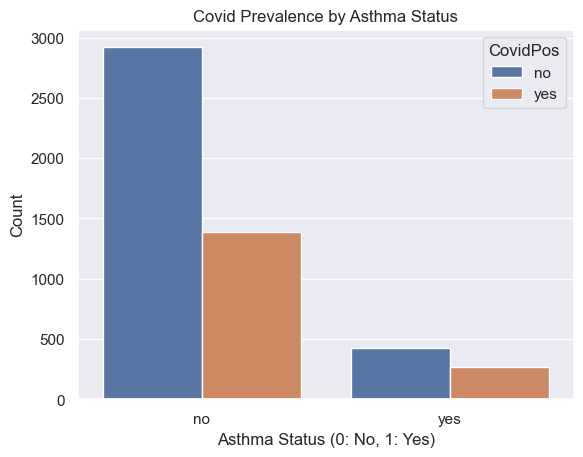

In [34]:
sns.countplot(x='HadAsthma', hue='CovidPos', data=sampled_data)
plt.title('Covid Prevalence by Asthma Status')
plt.xlabel('Asthma Status (0: No, 1: Yes)')
plt.ylabel('Count')
plt.show()

In [35]:
fig = px.parallel_categories(data, dimensions=['HadKidneyDisease', 'HadDiabetes', 'HighRiskLastYear'])
fig.update_layout(title='HadKidneyDisease, HadDiabetes  HighRiskLastYear')
fig.show()